# Lunar Lander #

## Imports ##

In [1]:
import gymnasium as gym
from stable_baselines3 import DQN, PPO, A2C
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.callbacks import BaseCallback
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from IPython.display import HTML, display
import matplotlib.animation as animation
import time

## Environnement ##

In [2]:
env = gym.make("LunarLander-v3", render_mode="rgb_array")

/opt/homebrew/lib/python3.10/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists


## Modeles ##

In [3]:
models = {
    "DQN": DQN("MlpPolicy", env, verbose=1),
    "PPO": PPO("MlpPolicy", env, verbose=1),
    "A2C": A2C("MlpPolicy", env, verbose=1)
}

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


## Callback ##

In [4]:
class RewardCallback(BaseCallback):
    def __init__(self):
        super().__init__()
        self.episode_rewards = []

    def _on_step(self) -> bool:
        if len(self.locals["infos"]) > 0 and "episode" in self.locals["infos"][0]:
            self.episode_rewards.append(self.locals["infos"][0]["episode"]["r"])
        return True

## Entrainement ##

In [5]:
timesteps = 500000
results = {}
reward_histories = {}

for name, model in models.items():
    print(f"\n=== Entraînement de {name} ===")
    callback = RewardCallback()
    
    start_time = time.time()
    model.learn(total_timesteps=timesteps, callback=callback)
    end_time = time.time()
    elapsed_time = end_time - start_time
    
    mean_reward, std_reward = evaluate_policy(model, env, n_eval_episodes=10)
    
    results[name] = {
        "mean_reward": mean_reward,
        "std_reward": std_reward,
        "execution_time_sec": elapsed_time
    }
    reward_histories[name] = callback.episode_rewards
    
    print(f"{name} - Score moyen: {mean_reward:.2f} ± {std_reward:.2f}, Temps: {elapsed_time:.2f} sec")



=== Entraînement de DQN ===
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 84.2     |
|    ep_rew_mean      | -153     |
|    exploration_rate | 0.994    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 1640     |
|    time_elapsed     | 0        |
|    total_timesteps  | 337      |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26     |
|    n_updates        | 59       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 86.4     |
|    ep_rew_mean      | -146     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 2073     |
|    time_elapsed     | 0        |
|    total_timesteps  | 691      |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.

/opt/homebrew/lib/python3.10/site-packages/stable_baselines3/common/evaluation.py:70: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


DQN - Score moyen: -30.72 ± 89.57, Temps: 631.64 sec

=== Entraînement de PPO ===
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 91.4     |
|    ep_rew_mean     | -171     |
| time/              |          |
|    fps             | 3510     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 91.7        |
|    ep_rew_mean          | -189        |
| time/                   |             |
|    fps                  | 2685        |
|    iterations           | 2           |
|    time_elapsed         | 1           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.012058918 |
|    clip_fraction        | 0.0611      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3

## Tableau comparatif ##

In [6]:
df_results = pd.DataFrame(results).T
print("\n=== Résultats comparatifs ===")
print(df_results)


=== Résultats comparatifs ===
     mean_reward  std_reward  execution_time_sec
DQN   -30.720433   89.566464          631.640823
PPO   150.812208   99.842535          507.560878
A2C  -116.088498   31.333311          643.120898


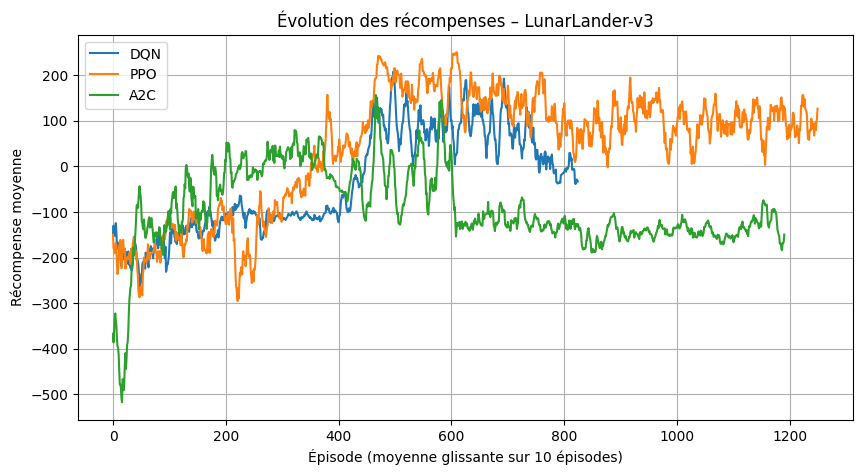

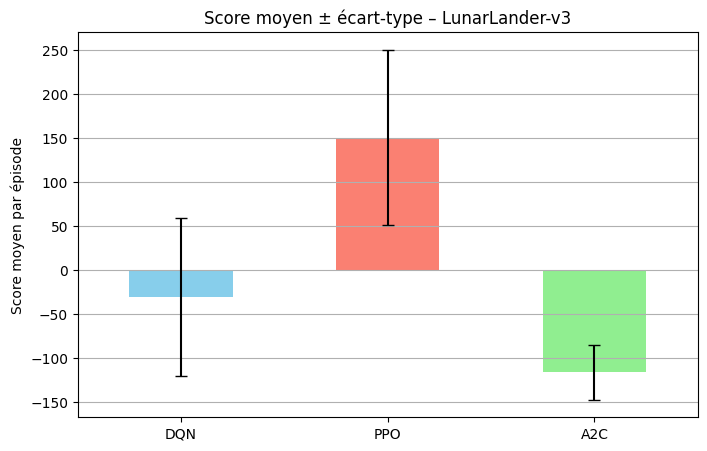

In [7]:
def moving_average(x, n=10):
    """Calcule la moyenne glissante sur n points"""
    return np.convolve(x, np.ones(n)/n, mode='valid')

plt.figure(figsize=(10, 5))
for name, rewards in reward_histories.items():
    if len(rewards) >= 10:
        plt.plot(moving_average(rewards, n=10), label=name)
    else:
        plt.plot(rewards, label=name)

plt.xlabel("Épisode (moyenne glissante sur 10 épisodes)")
plt.ylabel("Récompense moyenne")
plt.title("Évolution des récompenses – LunarLander-v3")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
df_results["mean_reward"].plot(
    kind="bar",
    yerr=df_results["std_reward"],
    capsize=4,
    color=["skyblue", "salmon", "lightgreen"],
    title="Score moyen ± écart-type – LunarLander-v3"
)
plt.ylabel("Score moyen par épisode")
plt.xticks(rotation=0)
plt.grid(axis="y")
plt.show()

## Visualisation du meilleur modele ##

In [8]:
best_model_name = df_results["mean_reward"].idxmax()
best_model = models[best_model_name]

obs, info = env.reset()
frames = []
done = False

while not done:
    action, _ = best_model.predict(obs)
    obs, reward, terminated, truncated, info = env.step(action)
    frames.append(env.render())
    done = terminated or truncated

fig = plt.figure()
plt.axis("off")
im = plt.imshow(frames[0])

def update(frame):
    im.set_array(frame)
    return [im]

ani = animation.FuncAnimation(fig, update, frames=frames, interval=50)
plt.close(fig)
display(HTML(ani.to_jshtml()))